In [1]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import os

In [2]:
os .getcwd()
os .chdir('C:\\Users\\Kristin\\Documents\\DataSets')

In [10]:
TOKENS = pd.read_csv('pm-abstracts-TOKENS2.csv')
BOW = pd.read_csv('pm-abstracts-BOW2.csv')
LIB = pd.read_csv('pm-abstracts-culled.csv')
DOCS = pd.read_csv('pm-abstracts-DOCS2-CT.csv')
#DOCS['doc_str'] = DOCS['term_str']
#del DOCS['term_str']
LIB = LIB[LIB.abstract_id.isin(DOCS.abstract_id.unique())]

In [13]:
LIB

,abstract_id,AB,AD,AU,FAU,CRDT,LR,DP,EDAT,IS,...,MHDA,JID,OWN,PHST,PST,PT,SO,STAT,TI,VI
2,11744656,"During exercise, pulse oximetry is problemati...","Department of Medicine, University of Califor...",Hopkins SR,"Hopkins, Susan R",2001/12/18 10:00,20161124.0,2002 Jan,2001/12/18 10:00,0161-7567 (Linking),...,2002/04/11 10:01,8502536,NLM,2001/12/18 10:00 [entrez],ppublish,"Research Support, U.S. Gov't, P.H.S.",J Appl Physiol (1985). 2002 Jan;92(1):162-8. ...,MEDLINE,Validity of pulse oximetry during maximal exe...,92
3,11744658,The physiological and metabolic demands of hi...,Research Institute for Sport and Exercise Sci...,Reilly T,"Reilly, T",2001/12/18 10:00,20171213.0,2002 Jan,2001/12/18 10:00,0161-7567 (Linking),...,2002/04/11 10:01,8502536,NLM,2001/12/18 10:00 [entrez],ppublish,"Research Support, Non-U.S. Gov't",J Appl Physiol (1985). 2002 Jan;92(1):179-87....,MEDLINE,Physiological and metabolic responses to a hi...,92
4,11744678,This study compared the effect of repetitive ...,Oulu Regional Institute of Occupational Healt...,Rintamäki H,"Rintamäki, Hannu",2001/12/18 10:00,20171213.0,2002 Jan,2001/12/18 10:00,0161-7567 (Linking),...,2002/04/11 10:01,8502536,NLM,2001/12/18 10:00 [entrez],ppublish,"Research Support, Non-U.S. Gov't",J Appl Physiol (1985). 2002 Jan;92(1):354-61....,MEDLINE,Combined effect of repetitive work and cold o...,92
18,11774067,Abstract. Relations between frequently used i...,Nutrition and Toxicology Research Institute M...,Hornstra G,"Hornstra, G",2002/01/05 10:00,20151119.0,2002 Jan,2002/01/05 10:00,0172-4622 (Linking),...,2002/02/20 10:01,8008349,NLM,2002/01/05 10:00 [entrez],ppublish,"Research Support, Non-U.S. Gov't",Int J Sports Med. 2002 Jan;23(1):50-4. doi: 1...,MEDLINE,Body composition and cardiorespiratory fitnes...,23
22,11782651,PURPOSE: To investigate the influences of men...,"Department of Health and Kinesiology, Texas A...",Wilmore JH,"Wilmore, Jack H",2002/01/10 10:00,20190901.0,2002 Jan,2002/01/10 10:00,0195-9131 (Linking),...,2002/02/20 10:01,8005433,NLM,2002/01/10 10:00 [entrez],ppublish,"Research Support, U.S. Gov't, P.H.S.",Med Sci Sports Exerc. 2002 Jan;34(1):74-82. d...,MEDLINE,"Menopause, estrogen, and training effects on ...",34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106957,35373947,PURPOSE: To compare the effectiveness of biof...,"Department of Urology, University of Health S...",Karabulut I,"Karabulut, Ibrahim",2022/04/04 11:12,20220406.0,2022 May-Jun,2022/04/05 06:00,1677-5538 (Linking),...,2022/04/07 06:00,101158091,NLM,2022/04/07 06:00 [medline],ppublish,Randomized Controlled Trial,Int Braz J Urol. 2022 May-Jun;48(3):501-511. ...,MEDLINE,Is biofeedback-assisted pelvic floor muscle t...,48
106961,35379222,BACKGROUND: Very positive effects have been d...,Healthcare Ethics Committee in the Burgos Uni...,Teodoro-Blanco PS,"Teodoro-Blanco, Pilar San",2022/04/05 05:27,20220408.0,2022 Apr 4,2022/04/06 06:00,1471-2474 (Linking),...,2022/04/07 06:00,100968565,NLM,2022/04/07 06:00 [medline],epublish,Journal Article,BMC Musculoskelet Disord. 2022 Apr 4;23(1):32...,MEDLINE,Effectiveness of a group intervention using p...,23
106962,35379294,PURPOSE: Few studies have recruited young adu...,"Department of Health Behavior, Gillings Schoo...",Tate DF,"Tate, Deborah F",2022/04/05 05:27,20220408.0,2022 Apr 4,2022/04/06 06:00,1745-6215 (Linking),...,2022/04/07 06:00,101263253,NLM,2022/04/07 06:00 [medline],epublish,Randomized Controlled Trial,Trials. 2022 Apr 4;23(1):254. doi: 10.1186/s1...,MEDLINE,Recruitment of young adult cancer survivors i...,23
106982,35389288,BACKGROUND: Following a prostate cancer (PC) ...,"Oregon Health & Science University, Portland,...",Winters-Stone KM,"Winters-Stone, Kerri M",2022/04/07 12:11,20220408.0,2022 Jan-Dec,2022/04/08 06:00,1534-7354 (Linking),...,2022/04/08 06:00,101128834,NLM,2022/04/08 06:00 [medline],ppublish,Journal Article,Integr Cancer Ther. 2022 Jan-Dec;21:153473542...,In-Process,Quality of Life of 

In [12]:
DOCS['Date1'] = LIB['CRDT']
DOCS['Date'] = DOCS['Date1'].str[:11]
del DOCS['Date1']
DOCS['Date'] = pd.to_datetime(DOCS['Date']).dt.strftime('%m/%Y')
DOCS

,abstract_id,doc_str,Date
0,11744656,"During exercise, pulse oximetry is problemati...",NaN
1,11744658,The physiological and metabolic demands of hi...,NaN
2,11744678,This study compared the effect of repetitive ...,12/2001
3,11774067,Abstract. Relations between frequently used i...,12/2001
4,11782651,PURPOSE: To investigate the influences of men...,12/2001
...,...,...,...
20306,36235628,This research examined the effects of single-...,NaN
20307,36237580,The issue of sports injury and rehabilitation...,NaN
20308,36243785,Women with overweight or obesity (OWOB) have ...,NaN
20309,36246968,PURPOSE: Cervical radiculopathy is disorder o...,NaN


In [10]:
#covid = DOCS[DOCS['doc_str'].str.contains('|'.join(keywords))].set_index("abstract_id")
#covid['count'] = covid.groupby('Date')['Date'].transform('count')
#pd.set_option('display.max_colwidth', -1)

In [6]:
DOCS.plot(x="Date", y="count", kind="line")
plt.show()

KeyError: 'count'

In [12]:
#covid = covid.reset_index()
#covid

In [14]:
bag = ['abstract_id']
del TOKENS['pos']
del TOKENS['sent_num']
del TOKENS['token_num']
TOKENS0 = TOKENS[TOKENS['term_str'].str.len()>=4]
#TOKENS1 = TOKENS0[~TOKENS0.index.isin(covid.index)]
BOW = TOKENS0.groupby(bag+['term_str']).term_str.count().to_frame('n')
BOW
#BOW = TOKENS.reset_index().set_index(bag)
#BOW

n
abstract_id term_str              
11726340    abuse                2
            author               1
            based                1
            behaviorperformance  1
            cases                1
...                             ..
17459696    values               1
            variables            1
            vulnerability        2
            week                 1
            with                 1

[995865 rows x 1 columns]

Title: topicmodel.py

Author: Rafael Alvarado

Date: May 2022

Code version: 1

Availability: https://github.com/ontoligent/DS5001-2022-01/blob/main/lib/topicmodel.py

In [15]:
import pandas as pd
import numpy as np
from sklearn.decomposition import LatentDirichletAllocation as LDA, NMF

class TopicModel():            

    bow_count_col:str = 'n'
    n_topics:int = 20
    n_top_terms:int = None
    engine_type = 'LDA' # Also NMF
    n_terms = 1000

    # LDA Params
    max_iter:int = 20
    learning_offset:float = 50.
    random_state:int = 0
    
    # NMF Params
    nmf_init = 'nndsvd'
    nmf_max_iter = 1000
    
    def __init__(self, BOW:pd.DataFrame, LIB:pd.DataFrame):
        self.BOW = BOW
        self.LIB = LIB
        
    def create_X(self):
        X = self.BOW[self.bow_count_col].unstack()
        V = X.count().to_frame('df')
        X = X.fillna(0)
        V['idf'] = np.log2(len(X)/V.df)
        V['dfidf'] = V.df * V.idf
        SIGS = V.sort_values('dfidf', ascending=False).head(self.n_terms).index
        self.X = X[SIGS]
        self.V = V              
        
    def get_model(self):
        
        if self.engine_type == 'LDA':
            self.engine = LDA(n_components=self.n_topics, 
                                  max_iter=self.max_iter, 
                                  learning_offset=self.learning_offset, 
                                  random_state=self.random_state)

        elif self.engine_type == 'NMF':
            self.engine = NMF(n_components=self.n_topics, 
                                  max_iter=self.nmf_max_iter,
                                  init=self.nmf_init, 
                                  random_state=1, 
                                  alpha=.1, 
                                  l1_ratio=.5)
                
        self.THETA = pd.DataFrame(self.engine.fit_transform(self.X.values), index=self.X.index)
        self.THETA.columns.name = 'topic_id'
        
        self.PHI = pd.DataFrame(self.engine.components_, columns=self.X.columns)
        self.PHI.index.name = 'topic_id'
        self.PHI.columns.name = 'term_str'
        
        self.TOPIC = self.PHI.sum(1).to_frame('phi_sum')
        self.TOPIC['theta_sum'] = self.THETA.sum()

    def describe_topics(self):
        
        PHI_P = (self.PHI.T / self.PHI.T.sum())
        PHI_I = np.log2(1/PHI_P)
        self.TOPIC['h'] = round((PHI_I * PHI_P).sum().sort_values(ascending=False), 2)
        if not self.n_top_terms:
            self.n_top_terms = round(self.TOPIC.h.mean())
            
        # Compute relevant terms
        self.get_relevant_terms(0)            

        self.TOPIC['top_terms'] = self.PHI.stack().to_frame('topic_weight')\
            .groupby('topic_id')\
            .apply(lambda x: 
                x.sort_values('topic_weight', ascending =False)\
                    .head(self.n_top_terms)\
                    .reset_index()['term_str'])\
            .apply(lambda x: ' '.join(x.replace(' ', '_')), 1)
        
        # Not using top terms from above; using from get_relevant_terms()
        self.TOPIC['label'] = self.TOPIC.apply(lambda x: f"{x.name}: {x.top_terms_rel}", 1)
                
    def get_relevant_terms(self, 𝜆 = .5):
        """
        Compute relevance of topic terms as defined by Sievert and Shirley 2014.
        C. Sievert and K. Shirley, “LDAvis: A Method for Visualizing and Interpreting Topics,” 
        in Proceedings of the workshop on interactive language learning, visualization, and interfaces, 2014, pp. 63–70.
        """
        Ptw = self.PHI.apply(lambda x: x / x.sum(), 1) # L1 norm of PHI rows, i.e. p(w|t)
        Pw = self.PHI.sum() / self.PHI.sum().sum() # Marginal probs of terms in PHI, i.e. p(w)
        self.REL = 𝜆 * np.log2(Ptw) + (1-𝜆) * np.log2(Ptw / Pw)
        self.TOPIC['top_terms_rel'] = self.REL.apply(lambda x: ' '.join(x.sort_values(ascending=False).head(self.n_top_terms).index), 1)

    def get_model_stats(self):
        # p = self.TOPIC.theta_sum / self.TOPIC.theta_sum.sum()
        self.entropy = self.TOPIC.h.sum()
        self.redundancy = 1 - self.entropy / np.log2(self.n_topics)
    
    def get_doc_stats(self):
        self.DOC = (self.THETA.T * np.log2(1/self.THETA.T)).sum().to_frame('entropy')
        self.DOC['max_topic'] = self.THETA.idxmax(1)
        
    def plot_topics(self):
        self.TOPIC.sort_values('theta_sum', ascending=True).plot.barh(y='theta_sum', x='label', figsize=(5, self.n_topics/2))

In [19]:
n_terms = 2000
n_topics = 15
max_iter = 25
# n_top_terms = 7
doc_topic_prior = .1 # Prior of document topic distribution alpha. Defaults to 1 / n_components.
topic_word_prior = .1 # Prior of topic word distribution beta. Defaults to 1 / n_components.

In [20]:
tm = TopicModel(BOW, LIB)
tm.n_topics = n_topics
tm.engine_type = 'LDA'
tm.create_X()
tm.get_model()
tm.describe_topics()
tm.get_model_stats()
tm.get_doc_stats()

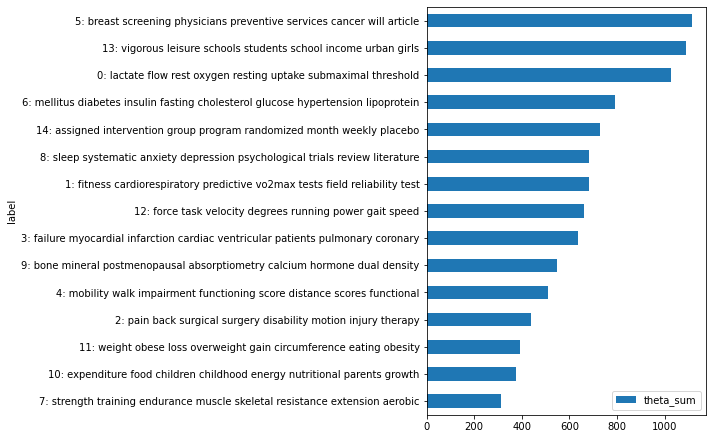

In [21]:
tm.plot_topics()

In [22]:
IMG1.T.shape

(15, 10000)

In [18]:
IMG1 = tm.THETA.groupby('abstract_id').mean()
#IMG1 = tm.THETA[tm.DOC.index.isin(covid.index)]
#IMG.index = LIB.loc[BOW1].label
IMG1.columns = tm.TOPIC.label
IMG1.T.style.background_gradient(cmap='GnBu')

In [38]:
IMG1 = tm.THETA.groupby('abstract_id')
IMG1 = tm.THETA[tm.DOC.index.isin(DOCS.index)]
IMG1

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
abstract_id,,,,,,,,,,,,,,,
11726340,0.002299,0.222092,0.002299,0.002299,0.002299,0.748023,0.002299,0.002299,0.002299,0.002299,0.002299,0.002299,0.002299,0.002299,0.002299
11728410,0.000457,0.073814,0.000457,0.000457,0.000457,0.531881,0.284277,0.000457,0.000457,0.000457,0.105005,0.000457,0.000457,0.000457,0.000457
11744656,0.336456,0.335326,0.001026,0.170438,0.001026,0.042373,0.001026,0.001026,0.001026,0.001026,0.001026,0.001026,0.105151,0.001026,0.001026
11744658,0.408766,0.000647,0.000647,0.000647,0.142828,0.000647,0.000647,0.000647,0.000647,0.000647,0.245837,0.000647,0.195450,0.000647,0.000647
11744678,0.338824,0.001058,0.001058,0.001058,0.001058,0.001058,0.024371,0.001058,0.001058,0.001058,0.001058,0.001058,0.526641,0.098523,0.001058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17457478,0.000494,0.046053,0.000494,0.000494,0.000494,0.000494,0.120127,0.000494,0.000494,0.049300,0.000494,0.052479,0.000494,0.713060,0.014536
17457698,0.000612,0.000612,0.000612,0.170491,0.213565,0.608604,0.000612,0.000612,0.000612,0.000612,0.000612,0.000612,0.000612,0.000612,0.000612
17457700,0.000570,0.000570,0.000570,0.202729,0.000570,0.407349,0.249596,0.000570,0.000570,0.000570,0.000570,0.000570,0.000570,0.134057,0.000570


In [39]:
IMG1.T

abstract_id,11726340,11728410,11744656,11744658,11744678,11749098,11749099,11749100,11755453,11755942,...,17454917,17455121,17456462,17456587,17456836,17457478,17457698,17457700,17458137,17459696
topic_id,,,,,,,,,,,,,,,,,,,,,
0,0.002299,0.000457,0.336456,0.408766,0.338824,0.000556,0.000409,0.000635,0.001010,0.221863,...,0.000513,0.289502,0.000590,0.000570,0.000590,0.000494,0.000612,0.000570,0.000505,0.000913
1,0.222092,0.073814,0.335326,0.000647,0.001058,0.000556,0.053156,0.000635,0.001010,0.167498,...,0.000513,0.000709,0.000590,0.000570,0.000590,0.046053,0.000612,0.000570,0.000505,0.075934
2,0.002299,0.000457,0.001026,0.000647,0.001058,0.000556,0.000409,0.000635,0.020952,0.000784,...,0.000513,0.000709,0.000590,0.096716,0.000590,0.000494,0.000612,0.000570,0.000505,0.000913
3,0.002299,0.000457,0.170438,0.000647,0.001058,0.000556,0.000409,0.000635,0.001010,0.000784,...,0.000513,0.000709,0.157431,0.181936,0.000590,0.000494,0.170491,0.202729,0.000505,0.000913
4,0.002299,0.000457,0.001026,0.142828,0.001058,0.000556,0.000409,0.000635,0.001010,0.000784,...,0.187099,0.000709,0.000590,0.000570,0.218471,0.000494,0.213565,0.000570,0.000505,0.000913
5,0.748023,0.531881,0.042373,0.000647,0.001058,0.075944,0.000409,0.000635,0.064914,0.000784,...,0.139834,0.000709,0.000590,0.000570,0.414439,0.000494,0.608604,0.407349,0.000505,0.400928
6,0.002299,0.284277,0.001026,0.000647,0.024371,0.304465,0.000409,0.000635,0.380070,0.000784,...,0.314485,0.081718,0.331998,0.215060,0.000590,0.120127,0.000612,0.249596,0.000505,0.079600
7,0.002299,0.000457,0.001026,0.000647,0.001058,0.000556,0.000409,0.000635,0.001010,0.000784,...,0.000513,0.357987,0.000590,0.000570,0.000590,0.000494,0.000612,0.000570,0.000505,0.000913
8,0.002299,0.000457,0.001026,0.000647,0.001058,0.133199,0.000409,0.000635,0.001010,0.000784,...,0.000513,0.000709,0.157936,0.114717,0.360011,0.000494,0.000612,0.000570,0.000505,0.124644


In [45]:
test = IMG1.groupby(by=tm.TOPIC.label)
test

In [25]:
#tm1 = tm.DOC[tm.DOC.index.isin(covid.index)].reset_index()
#tm1
df = tm.DOC.reset_index()
df

,index,abstract_id,entropy,max_topic
0,0,11726340,1.057356,5
1,1,11728410,1.675004,5
2,2,11744656,2.129187,0
3,3,11744658,1.961948,0
4,4,11744678,1.591289,12
...,...,...,...,...
9995,9995,17457478,1.494448,13
9996,9996,17457698,1.425164,5
9997,9997,17457700,1.950512,5
9998,9998,17458137,1.892133,13


In [19]:
DOCS

,abstract_id,doc_str,Date
0,11726340,a three pronged model for a comprehensive psyc...,12/2001
1,11728410,background total cholesterol tc and lipoprotei...,12/2001
2,11744656,during exercise pulse oximetry is problematic ...,12/2001
3,11744658,the physiological and metabolic demands of hil...,12/2001
4,11744678,this study compared the effect of repetitive w...,12/2001
...,...,...,...
106986,35391527,objectives this study divided the factors that...,04/2022
106987,35391625,purpose the focus of spine20 is to develop evi...,04/2022
106988,35391874,background athletics also known as track and f...,04/2022
106989,35392658,male hypogonadism is defined as low circulatin...,04/2022


In [40]:
N_best_topics=3

absids=IMG1.T.columns
trenddf=pd.DataFrame(index=DOCS['Date'].unique(),columns=IMG1.columns)
v=np.zeros(trenddf.shape)
lookup={"2002":0,"2003":1,"2004":2, "2005":3, "2006":4, "2007":5, "2008":6, "2009":7, "2010":8, "2011":9, "2012":10, "2013":11, "2014":12, "2015":13, "2016":14, "2017":15, "2018":16, "2019":17, "2020":18, "2021":19, "2022":20}
for absid in absids:
    best_topic_idxs=IMG1.T[absid].sort_values(ascending=False).iloc[0:N_best_topics].index.values
    for idx in best_topic_idxs:
        date=DOCS.loc[absid]['Date']
        row=lookup[date]
        v[row,idx]+=1
        
trenddf=pd.DataFrame(index=covid['Date'].unique(),columns=IMG1.columns,data=v)

KeyError: 11726340

In [67]:
trenddf

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
06/2020,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
09/2020,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
11/2020,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
12/2020,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
01/2021,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
02/2021,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
03/2021,2.0,2.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
04/2021,1.0,0.0,0.0,0.0,1.0,1.0,1.0,3.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0
05/2021,0.0,1.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0
07/2021,0.0,1.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [41]:
trenddf.to_csv("trenddf_ALL.csv")